# Install detectron2

In [1]:
!pip install pyyaml==5.1
# This is the current pytorch version on Colab. Uncomment this if Colab changes its pytorch version
# !pip install torch==1.9.0+cu102 torchvision==0.10.0+cu102 -f https://download.pytorch.org/whl/torch_stable.html

# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.9/index.html
exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

     |████████████████████████████████| 274 kB 4.2 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=f17dadb2cdc4503ccf27561b4aa6043810c7296c1af967bf227f970bcfe20ff5
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.9/index.html
     |████████████████████████████████| 6.4 MB 691 kB/s 
     |████████████████████████████████| 145 kB 4.2 MB/s 
     |████████████████████████████████| 49 kB 5.8 MB/s 
     |████████████████████████████████| 130 kB 43.5 MB/s 
     |████████████████████████████████| 74 kB 3.2 MB/s 
     |████████████████████████████████| 743 kB 40.8 MB/s 
     |████████████████████████████████| 745 kB 35.2 MB/s 
     |███

In [1]:
# check pytorch installation: 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.9")   # please manually install torch 1.9 if Colab changes its default version

1.9.0+cu102 True


In [2]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances

# Run a pre-trained detectron2 model on Max's Picture

This is just something quick to familiarize with detectron2 real quick

Loading config /usr/local/lib/python3.7/dist-packages/detectron2/model_zoo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.
The checkpoint state_dict contains keys that are not used by the model:
  pixel_mean
  pixel_std
  anchor_generator.cell_anchors.{0, 1, 2, 3, 4}
/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and 

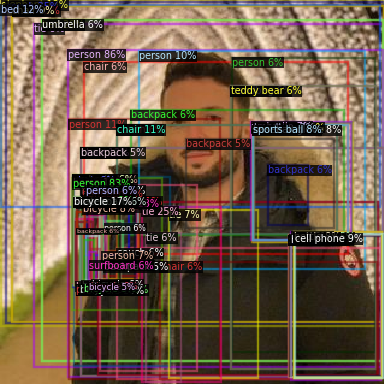

In [3]:
!wget https://pkimgcdn.peekyou.com/70460190dccf62e530ba46a6982b1d4d.jpeg -q -O input.jpg
im = cv2.imread("/content/input.jpg")
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# detectron2's model zoo.
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)
# look at the outputs. See https://detectron2.readthedocs.io/tutorials/models.html#model-output-format for specification
# print(outputs["instances"].pred_classes)
# print(outputs["instances"].pred_boxes)
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

# Train on sattelite imagery dataset

Just a copy-paste of coco format script with some changes to make it work on collab with the old examples in the drive folder. 

TODOs:
1. generate examples using the updated make_examples
2. Work on TODOs in coco_format script
3. Most importantly split train, val

In [5]:
!pip install geopandas

     |████████████████████████████████| 994 kB 4.3 MB/s 
     |████████████████████████████████| 6.6 MB 39.7 MB/s 
     |████████████████████████████████| 15.4 MB 37 kB/s 


In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
#%%
import os
import json
import geopandas as gpd

#%%
examples = gpd.read_file("./drive/MyDrive/sierra_leone/examples/tower_examples.geojson")
display(examples)

#%%
info={
    "year":2021,
    "version": "1.0",
    "description": "Satellite Imagery Dataset",
    "contributor": "PyPSA-meets-Africa",
    "url": "example.com",
    "date_created": "2021/8/28"
}

license = {
    "id": "1",
    "name": "Maxar?",
    "url": "maxar.org"
}

category = {
    "id": 1,
    "name": "tower",
    "supercategory": "power"
}

#%%
images = []
annotations = []
img_dir = "./drive/MyDrive/sierra_leone/examples/"
img_list = [img for img in os.listdir(img_dir) if img.endswith(".png")]
for idx, exp in examples.iterrows():
    image={}
    img_filename = str(exp.filename) + ".png"
    img_path = os.path.join(img_dir, img_filename)
    
    if img_filename not in img_list:
        print("EXAMPLE NOT FOUND")

    image_id = int(idx+1)
    image["id"] = image_id
    image["width"] = 512
    image["height"] = 512
    image["file_name"] = img_filename
    image["license"] = 1
    images.append(image)

    annotation = {}

    bbox_width = 30
    bbox_height = 25 # tower_height

    x_top_left = exp.ul_x
    y_top_left = exp.ul_y


    annotation["id"] = image_id
    annotation["image_id"] = image_id
    annotation["segmentation"] = []
    annotation["area"] = bbox_width * bbox_height
    annotation["iscrowd"] = 0 

    annotation["bbox"] = [x_top_left, y_top_left, bbox_width, bbox_height]
    annotation["category_id"] = 1

    annotations.append(annotation)

print(image)
print(annotation)
#%%


#%%
coco_format = {
    "info": info,
    "licenses": [license],
    "categories": [category],
    "images": images,
    "annotations": annotations
}

display(coco_format)


# %%
with open('./tower_coco.json', 'w') as fp:
    json.dump(coco_format, fp)


# %%


,filename,ul_x,ul_y,lr_x,lr_y,geometry
0,fde7c561-2805-4cc4-9751-da418ae758fa,30.0,242.0,90.0,292.0,"POLYGON ((-12.04131 8.90033, -12.03903 8.90033..."
1,3ff635d4-2210-4fa4-aaa8-c543d445e9d1,350.0,382.0,410.0,432.0,"POLYGON ((-12.12192 8.87489, -12.11963 8.87489..."
2,28004bac-3c5c-4f72-af48-a828eaddc865,378.0,422.0,438.0,472.0,"POLYGON ((-12.02161 8.91419, -12.01933 8.91419..."
3,0eda994c-4ba6-4c10-aeda-d071b7d155d7,36.0,424.0,96.0,474.0,"POLYGON ((-12.00691 8.92345, -12.00463 8.92345..."
4,906bd0e5-6a55-450b-ae55-058bdfc9725b,156.0,464.0,216.0,514.0,"POLYGON ((-12.07202 8.88891, -12.06973 8.88891..."
...,...,...,...,...,...,...
195,5eb31cbc-304a-4f2b-a6a3-a40db52e2770,16.0,254.0,76.0,304.0,"POLYGON ((-12.24812 8.82556, -12.24543 8.82556..."
196,5dc1a6eb-4ee7-4969-b7f2-2350d8c11b2a,157.0,376.0,217.0,426.0,"POLYGON ((-12.21865 8.77940, -12.21595 8.77940..."
197,271006c0-87a3-4139-9238-98edfa1ff7d5,450.0,465.0,510.0,515.0,"POLYGON ((-12.14798 8.85968, -12.14528 8.85968..."
198,9d9b5398-5f91-4b1e-a3d4-41cd3260b92f,136.0,86.0,196.0,136.0,"POLYGON ((-12.20979 8.82897, -12.20710 8.82897..."


{'id': 200, 'width': 512, 'height': 512, 'file_name': 'c09d57c2-14a2-4923-8a82-2d01a17de81b.png', 'license': 1}
{'id': 200, 'image_id': 200, 'segmentation': [], 'area': 750, 'iscrowd': 0, 'bbox': [77.0, 119.0, 30, 25], 'category_id': 1}


{'annotations': [{'area': 750,
   'bbox': [30.0, 242.0, 30, 25],
   'category_id': 1,
   'id': 1,
   'image_id': 1,
   'iscrowd': 0,
   'segmentation': []},
  {'area': 750,
   'bbox': [350.0, 382.0, 30, 25],
   'category_id': 1,
   'id': 2,
   'image_id': 2,
   'iscrowd': 0,
   'segmentation': []},
  {'area': 750,
   'bbox': [378.0, 422.0, 30, 25],
   'category_id': 1,
   'id': 3,
   'image_id': 3,
   'iscrowd': 0,
   'segmentation': []},
  {'area': 750,
   'bbox': [36.0, 424.0, 30, 25],
   'category_id': 1,
   'id': 4,
   'image_id': 4,
   'iscrowd': 0,
   'segmentation': []},
  {'area': 750,
   'bbox': [156.0, 464.0, 30, 25],
   'category_id': 1,
   'id': 5,
   'image_id': 5,
   'iscrowd': 0,
   'segmentation': []},
  {'area': 750,
   'bbox': [57.0, 431.0, 30, 25],
   'category_id': 1,
   'id': 6,
   'image_id': 6,
   'iscrowd': 0,
   'segmentation': []},
  {'area': 750,
   'bbox': [95.0, 223.0, 30, 25],
   'category_id': 1,
   'id': 7,
   'image_id': 7,
   'iscrowd': 0,
   'segmenta

In [10]:
# for d in ["train", "val"]:
#     register_coco_instances("tower_" + d, {}, f"tower_coco_{d}.json", os.join.path("./drive/MyDrive/sierra_leone/examples/",d))

tower_dataset = "tower_train"
register_coco_instances(tower_dataset, {}, "tower_coco.json", "./drive/MyDrive/sierra_leone/examples/")

tower_metadata = MetadataCatalog.get("tower_train")
dataset_dicts = DatasetCatalog.get(tower_dataset)
display(dataset_dicts)

[08/28 19:19:09 d2.data.datasets.coco]: Loaded 200 images in COCO format from tower_coco.json


[{'annotations': [{'bbox': [30.0, 242.0, 30, 25],
    'bbox_mode': <BoxMode.XYWH_ABS: 1>,
    'category_id': 0,
    'iscrowd': 0}],
  'file_name': './drive/MyDrive/sierra_leone/examples/fde7c561-2805-4cc4-9751-da418ae758fa.png',
  'height': 512,
  'image_id': 1,
  'width': 512},
 {'annotations': [{'bbox': [350.0, 382.0, 30, 25],
    'bbox_mode': <BoxMode.XYWH_ABS: 1>,
    'category_id': 0,
    'iscrowd': 0}],
  'file_name': './drive/MyDrive/sierra_leone/examples/3ff635d4-2210-4fa4-aaa8-c543d445e9d1.png',
  'height': 512,
  'image_id': 2,
  'width': 512},
 {'annotations': [{'bbox': [378.0, 422.0, 30, 25],
    'bbox_mode': <BoxMode.XYWH_ABS: 1>,
    'category_id': 0,
    'iscrowd': 0}],
  'file_name': './drive/MyDrive/sierra_leone/examples/28004bac-3c5c-4f72-af48-a828eaddc865.png',
  'height': 512,
  'image_id': 3,
  'width': 512},
 {'annotations': [{'bbox': [36.0, 424.0, 30, 25],
    'bbox_mode': <BoxMode.XYWH_ABS: 1>,
    'category_id': 0,
    'iscrowd': 0}],
  'file_name': './drive/My

Visualize the annotations of randomly selected samples in the training set:

TODO:
1. Improve BBOXes 


[08/28 19:20:14 d2.data.datasets.coco]: Loaded 200 images in COCO format from tower_coco.json


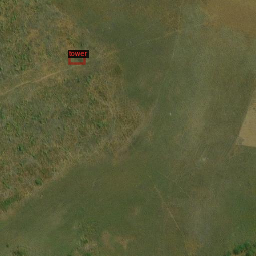

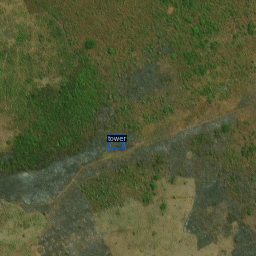

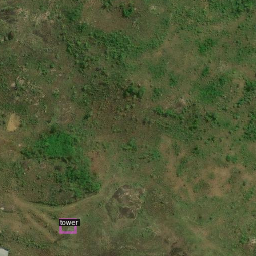

In [11]:
# dataset_dicts = get_balloon_dicts("balloon/train")
dataset_dicts = DatasetCatalog.get(tower_dataset)
tower_metadata = MetadataCatalog.get(tower_dataset)
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=tower_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

## Train Model

Takes ~10 minutes to train 300 iterations on a K80 GPU.


In [12]:
!nvidia-smi

Sat Aug 28 19:21:44 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.57.02    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   73C    P0    74W / 149W |    884MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [14]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = (tower_dataset) # Training Dataset
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml") 
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # should increase this a lot
cfg.SOLVER.STEPS = []        # does not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (tower). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

Loading config /usr/local/lib/python3.7/dist-packages/detectron2/model_zoo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


[08/28 19:23:55 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

The checkpoint state_dict contains keys that are not used by the model:
  pixel_mean
  pixel_std
  anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


[08/28 19:23:57 d2.engine.train_loop]: Starting training from iteration 0
[08/28 19:24:41 d2.utils.events]:  eta: 0:10:40  iter: 19  total_loss: 2.221  loss_cls: 1.551  loss_box_reg: 0.6481  time: 2.2442  data_time: 0.0501  lr: 1.6068e-05  max_mem: 3726M
[08/28 19:25:15 d2.utils.events]:  eta: 0:08:08  iter: 39  total_loss: 2.053  loss_cls: 1.323  loss_box_reg: 0.6994  time: 1.9463  data_time: 0.0068  lr: 3.2718e-05  max_mem: 3726M
[08/28 19:25:47 d2.utils.events]:  eta: 0:06:49  iter: 59  total_loss: 1.537  loss_cls: 0.9225  loss_box_reg: 0.6116  time: 1.8229  data_time: 0.0063  lr: 4.9367e-05  max_mem: 3726M
[08/28 19:26:18 d2.utils.events]:  eta: 0:05:59  iter: 79  total_loss: 1.252  loss_cls: 0.8013  loss_box_reg: 0.441  time: 1.7583  data_time: 0.0062  lr: 6.6017e-05  max_mem: 3726M
[08/28 19:26:50 d2.utils.events]:  eta: 0:05:25  iter: 99  total_loss: 1.163  loss_cls: 0.7866  loss_box_reg: 0.3567  time: 1.7207  data_time: 0.0065  lr: 8.2668e-05  max_mem: 3726M
[08/28 19:27:22 d2.

In [15]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 754), started 0:08:21 ago. (Use '!kill 754' to kill it.)

<IPython.core.display.Javascript object>

## Inference & evaluation using the trained model
Create a predictor



In [17]:
# Inference should use the config with parameters that are used in training
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.1   # just set it really low to actually see some results

cfg.MODEL.RETINANET.NUM_CLASSES = 1 # Need to add this for retinanet, probably need to add other things too
predictor = DefaultPredictor(cfg)

Skip loading parameter 'head.cls_score.weight' to the model due to incompatible shapes: (720, 256, 3, 3) in the checkpoint but (9, 256, 3, 3) in the model! You might want to double check if this is expected.
Skip loading parameter 'head.cls_score.bias' to the model due to incompatible shapes: (720,) in the checkpoint but (9,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
head.cls_score.{bias, weight}


Visualize the prediction results

TODO:
1. Something is wrong with the code here. It needs to be fixed.
2. Do previous todos. This might solve itself

[08/28 19:35:25 d2.data.datasets.coco]: Loaded 200 images in COCO format from tower_coco.json
Instances(num_instances=0, image_height=512, image_width=512, fields=[pred_boxes: Boxes(tensor([], size=(0, 4))), scores: tensor([]), pred_classes: tensor([], dtype=torch.int64)])


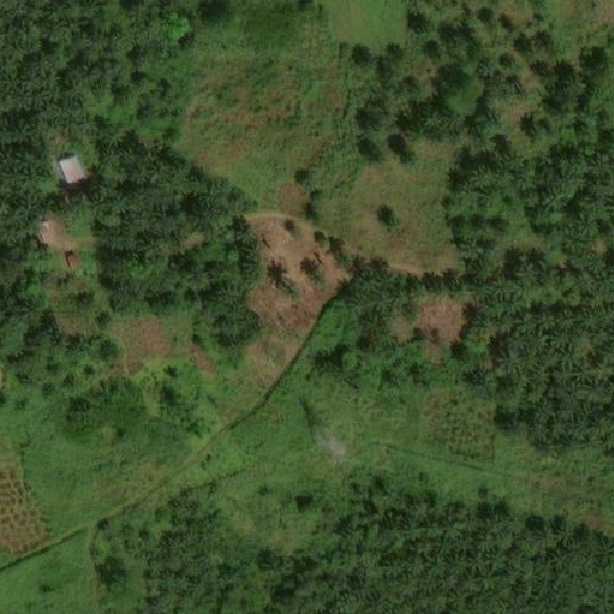

Instances(num_instances=0, image_height=512, image_width=512, fields=[pred_boxes: Boxes(tensor([], size=(0, 4))), scores: tensor([]), pred_classes: tensor([], dtype=torch.int64)])


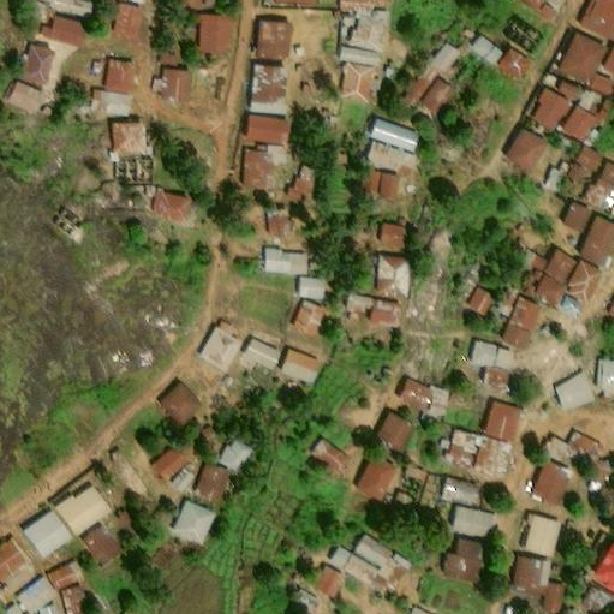

Instances(num_instances=0, image_height=512, image_width=512, fields=[pred_boxes: Boxes(tensor([], size=(0, 4))), scores: tensor([]), pred_classes: tensor([], dtype=torch.int64)])


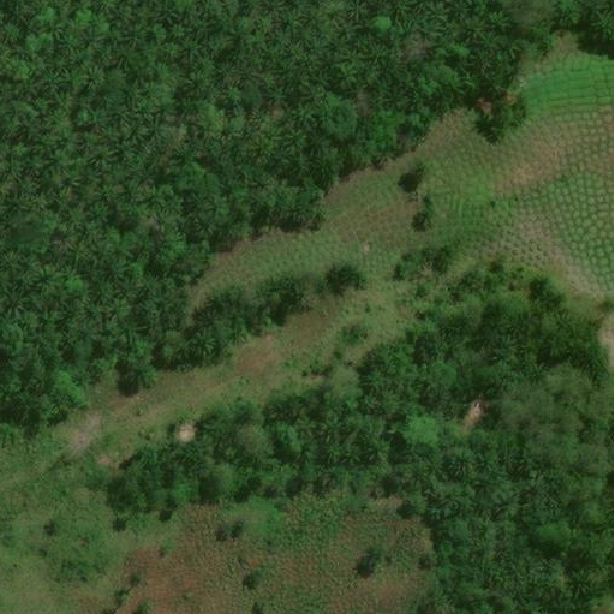

In [19]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get(tower_dataset)
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    # print(outputs)
    v = Visualizer(im[:, :, ::-1],
                   metadata=tower_metadata, 
                   scale=1.2
    )
    print(outputs["instances"].to("cpu"))
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

Evaluation using AP metric implemented in COCO API.

In [21]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
# tower_val = "tower_val"
tower_val = "tower_train" # Just testing evaluation code on training
evaluator = COCOEvaluator(tower_val)
val_loader = build_detection_test_loader(cfg, tower_val)
print(inference_on_dataset(trainer.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[08/28 19:41:21 d2.data.datasets.coco]: Loaded 200 images in COCO format from tower_coco.json
[08/28 19:41:21 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/28 19:41:21 d2.data.common]: Serializing 200 elements to byte tensors and concatenating them all ...
[08/28 19:41:21 d2.data.common]: Serialized dataset takes 0.05 MiB
[08/28 19:41:21 d2.evaluation.evaluator]: Start inference on 200 batches
[08/28 19:41:25 d2.evaluation.evaluator]: Inference done 11/200. Dataloading: 0.0017 s/iter. Inference: 0.3700 s/iter. Eval: 0.0004 s/iter. Total: 0.3721 s/iter. ETA=0:01:10
[08/28 19:41:31 d2.evaluation.evaluator]: Inference done 25/200. Dataloading: 0.0021 s/iter. Inference: 0.3693 s/iter. Eval: 0.0005 s/iter. Total: 0.3720 s/iter. ETA=0:01:05
[08/28 19:41:36 d2.evaluation.evaluator]: Inference done 39/200. Dataloading: 0.0020 s/iter. Inference: 0.3693 s/iter. Eval: 0.0004 s/

AssertionError: ignored